# PLOT maps and make movies 

_Last update: 2025-04-09_

Tutorial to illustrate how to open, read and plot the DREAM model outputs.

This notebook is based on running PYTHON in  the cells bellow. To run a cell, select it and do SHFT+ENTER or click on the "play" symbole in the top menu. To edit a cell: select it and click and edit on the text as in a text editor.

You can also read  https://jupyter-notebook.readthedocs.io/en/stable/notebook.html or 
if you need.


# Import Python Packages

(those are already installed in the Docker container you're working in)

In [34]:
## standart libraries
import os,sys
import numpy as np

# xarray
import xarray as xr
    
# plot
import cartopy.crs as ccrs
import cartopy.feature as ccf
import cartopy.util as ccu
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import matplotlib.animation as animation
from IPython.display import HTML

# My custom module with plot tools
import utils_SLX_plots_dream as slx


# Only if using jupyter notebook. Otherwise, comment out.
%matplotlib inline 

---

# Read DREAM model outputs:

You have already produced some outputs by running the DREAM model in the DOcker container. Those outputs were saved in `DREAM/dream_results/"+EXPID+"/netcdfs/` where `EXPID` is the name of your experiment. By default it was set to `TESTEXPEDOCKER` in the tutorial but you might have changed it. If so, set `EXPID` to the name you used in the cell bellow.

In the example below, we will read outputs from the `dreamT31L15_T_500.nc` file containing the air temperature anomaly at 500 hPa. "anomly" means that the mean state was already substracted when saving the outputs (see in the diagnostics script). 

* Set parameters:

In [37]:
EXPID="TESTEXPEDOCKER"

# local directory of input files (in the DOcker container)
diri = "/home/jovyan/work/DREAM/dream_results/"+EXPID+"/netcdfs/"

# input file
fili = "dreamT31L15_T_500.nc"

# where to save output plots and movies
diro = "/home/jovyan/work/DREAM/dream_results/"+EXPID+"/plots/"

* Read data (with the python package xarray):

In [38]:
#read  temperature anomaly from file
airanom = xr.open_dataset(diri+fili,decode_times=True)['air'].squeeze()
# note: .squeeze() is used to get rid of the spurious dimensions (i.e. here, level)

---
# Display basic infos

* Now that you have loaded the data from the file, you can check what it is by printing its infos:

In [39]:
# print info on the array
print(airanom)

<xarray.DataArray 'air' (time: 61, lat: 48, lon: 96)> Size: 2MB
[281088 values with dtype=float64]
Coordinates:
  * lat      (lat) float64 384B -87.16 -83.48 -79.78 ... 79.78 83.48 87.16
  * lon      (lon) float64 768B 0.0 3.75 7.5 11.25 ... 345.0 348.8 352.5 356.2
    lev      float64 8B 0.5
  * time     (time) datetime64[ns] 488B 1900-01-01 ... 1900-01-16
Attributes:
    units:          degC
    long_name:      air temperature on sigma levels
    standard_name:  temperature


* Print max, min, mean values of all array

In [40]:
print(airanom.max().values)
print(airanom.mean().values)
print(airanom.min().values)

1.6958754077513731
0.12460827775958627
-1.6857911643056696


---
# Print basic plots

### __Select one time step (select time with its __index__ , i.e. ```it``` is an integer):__

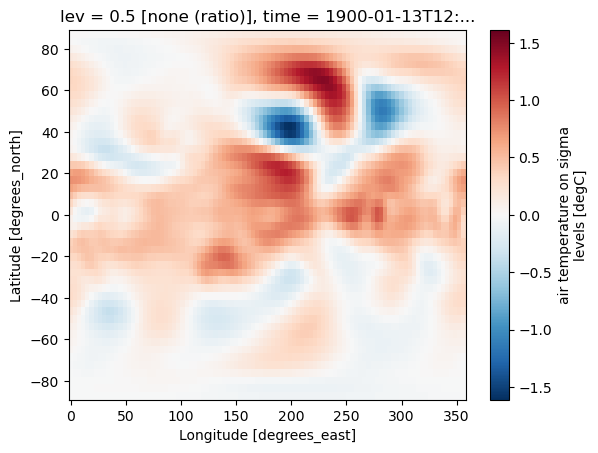

In [41]:
# time index at which select data
it = 50

# select data
datasubset1 = airanom.isel(time=it)

# plot (quick and dirty first look)
datasubset1.plot()

### __Select data with a time coordinate (```cdate``` is a calendar date):__

_Note that in that case, we use the function ```.sel()``` (while it was ```.isel()``` above when using an index.)_

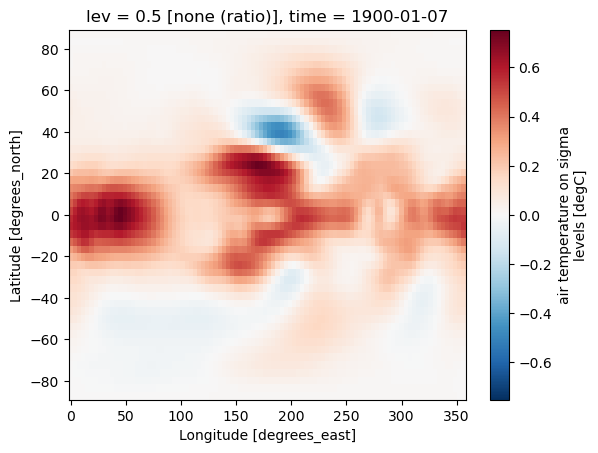

In [42]:
# time index at which select data
cdate = '1900-01-07T00:00:00'

# select data
datasubset2 = airanom.sel(time=cdate)

# plot (quick and dirty first look)
datasubset2.plot()

_Note: to plot nicer and more customed maps, see below._


### __Now select all timesteps at one grid point and plot timeseries__ 

Let's select the location where the heating perturbation was applied in our perturbation run (at 180°,0N):

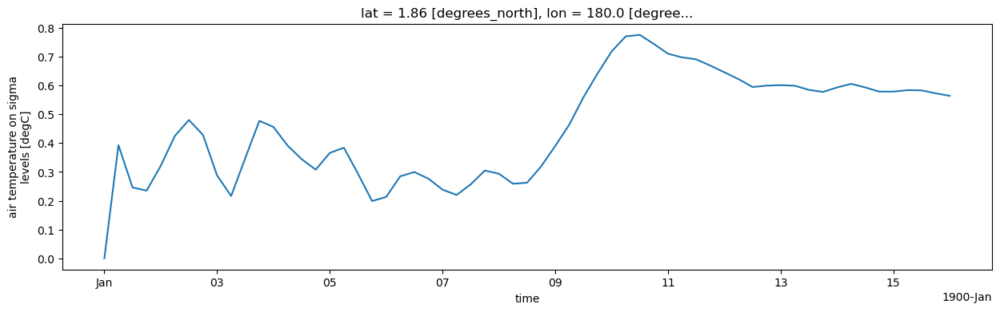

In [8]:
# select data
datasubset3 = airanom.sel(lat=0.,lon=180.,method='nearest')

# plot
fig1 = plt.figure(figsize=([15,4]),facecolor='white')        
datasubset3.plot()
plt.show()

---
# Plot a sequence of nice maps (with geographic projection):

The code below is more complex than above. It loops on all the timesteps and plot a map each timestep (or could also be one map every day  or anything else). It uses a plot function that i have written, called with ```cs = slx.plotmap(...)``` where ```(...)``` are the plot options.

Two examples are shown below:
1. A loop on time steps that will plot a map and _save in a png file_ for each time step.
2. A loop on time steps that will _display a movie_ of the successive maps on line in this notebook and _save it as a mp4_.

### 0. First set some parameters:

In [54]:
#------------ geography
# Global plot? True/False
glo= True

# center longitude on:
loncentr=180.

# set coastL to True if you want coaslines
coastL=True


# min max values on the colorscale
vmin=-3
vmax=3

# colormap
cm_base=slx.make_NCLcolormap()

# number of color segments of the colormap
Nincr=30

# color of the values smaller than vmin
su='#EFF5FB'
# color of the values larger than vmax
so='#F8E0E0'

# colorbar label 
labelplt= "500 hPa Temperature anomaly ("+airanom.units+")"

# number of labels on the colorbar
Nbar=6

#
# plot resolution (dpi)
dpifig=200

# base name for output plot file
plti="T500_"+EXPID


### 1. Plot a sequence of PNG files: 

Saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots//T500_TESTEXPEDOCKER.115.png
Saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots//T500_TESTEXPEDOCKER.116.png


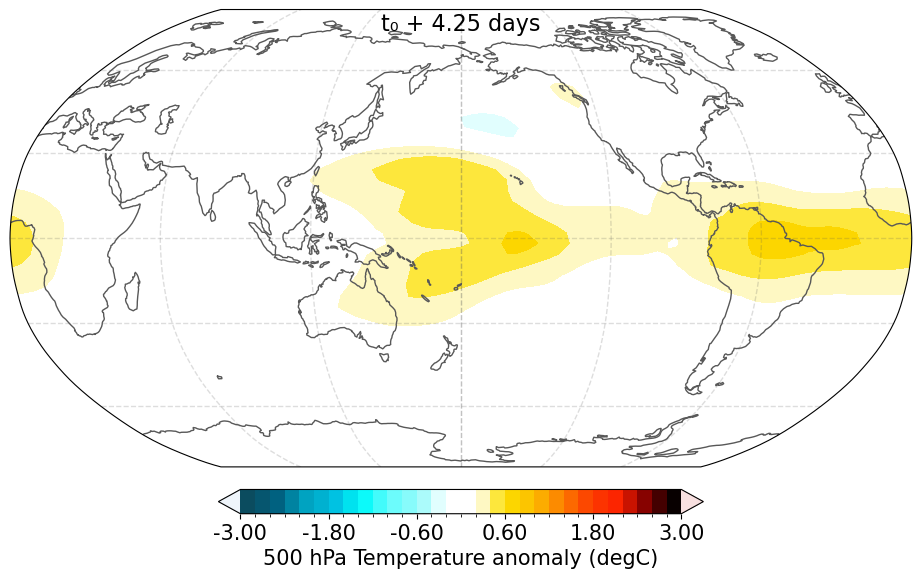

Saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots//T500_TESTEXPEDOCKER.117.png
Saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots//T500_TESTEXPEDOCKER.118.png
Saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots//T500_TESTEXPEDOCKER.119.png


In [55]:
# type of plot (can be 'contourf', 'pcolormesh', defaut is contourf)
typlo='contourf'

# plot format
pltty = ".png"

# loop on all time steps in the data array:
#for it in range(0,airanom.time.size):
for it in range(0,61):
     
        # this is to plor only once a day (when hour==00)
        #if (time.hour[it]==0):
                
            # output plot file name including the time index
            plto = plti+"."+str(it+100)

            # data to plot (must be a 2-d np.array)
            # here we select one timestep at a time for plotting purposes
            data2plot  = airanom.isel(time=it).values

            # make the data to plot cyclic so that the values at longitude 0 are repeated at 360. (for plot purposes)
            cyclic_data, cyclic_lons = ccu.add_cyclic_point(data2plot, coord=airanom.lon.values)

            #----------------------------------------------------
            #------ PLOT ----------------------------------------
            #----------------------------------------------------

            # create fig
            fig1 = plt.figure(figsize=([10,6]),facecolor='white')

            # plot data (base plot from plotmap functionn defined above)
            cs = slx.plotmap(fig1,cyclic_data,cyclic_lons,airanom.lat.values,plto,cm_base=cm_base,vmin=vmin,vmax=vmax,Nincr=Nincr,glo=glo,coastL=coastL,su=su,so=so,loncentr=loncentr,typlo=typlo,Nbar=Nbar,labelplt=labelplt)

            # add title on plot (date)
            #plt.title(slx.printdatestring(airanom.time.to_index(),it))
            # Compute days since t0
            t0 = airanom.time[0].values
            current_time = airanom.time[it].values
            delta_days = (np.datetime64(current_time) - np.datetime64(t0)) / np.timedelta64(1, 'D')
            title_text = fig1.text(0.5, 0.94, f"t₀ + {delta_days:.2f} days", ha='center', fontsize=16)
            
            plt.tight_layout()
         
            if it==17:
                # display plot only once in the loop
                plt.show()
            # Save fig in png, resolution dpi
            fig1.savefig(diro+"/"+plto+'.png', facecolor=fig1.get_facecolor(), edgecolor='none', dpi=dpifig,bbox_inches='tight', pad_inches=0)
            print("Saved: "+diro+"/"+plto+'.png')
            # close fig
            plt.close(fig1)       

### 2. Animate the sequence of maps online in this notebook and then save a movie:

* It saves the animation as mp4 (could also be gif)

In [57]:
# movie format
movft="mp4" # "mp4" or "gif"

# type of plot (can be 'contourf', 'pcolormesh', defaut is contourf)
typlo='pcolormesh'

# plot initial time frame
data2plot  = airanom.isel(time=0).values
# make the data to plot cyclic so that the values at longitude 0 are repeated at 360. (for plot purposes)
cyclic_data, cyclic_lons = ccu.add_cyclic_point(data2plot, coord=airanom.lon.values)

# create fig
fig = plt.figure(figsize=([10,6]),facecolor='white')

# plot data (base plot from plotmap functionn defined above)
cs = slx.plotmap(fig,cyclic_data,cyclic_lons,airanom.lat.values,cm_base=cm_base,vmin=vmin,vmax=vmax,Nincr=Nincr,glo=glo,coastL=coastL,su=su,so=so,loncentr=loncentr,typlo=typlo,Nbar=Nbar,labelplt=labelplt)

# add title on plot (date)
title_text = fig.text(0.5, 0.94, "", ha='center', fontsize=16)

# Animation function
def animate(ie):
    frame = airanom.isel(time=ie).values
    cyclic_frame, _ = ccu.add_cyclic_point(frame, coord=airanom.lon.values)
    cs.set_array(cyclic_frame.flatten())

    # Compute days since t0
    t0 = airanom.time[0].values
    current_time = airanom.time[ie].values
    delta_days = (np.datetime64(current_time) - np.datetime64(t0)) / np.timedelta64(1, 'D')

    # Update title
    title_text.set_text(f"t0 + {delta_days:.2f} days")
    return [cs]


def init():
    frame = airanom.isel(time=0).values
    cyclic_frame, _ = ccu.add_cyclic_point(frame, coord=airanom.lon.values)
    cs.set_array(cyclic_frame.flatten())
    title_text.set_text("t0 + 0.00 days")
    return [cs]


# Create the animation
ani = animation.FuncAnimation(fig=fig,
                              func=animate,
                              frames=60,
                              init_func=init,
                              interval=300,
                              blit=True)

# Close the figure after creating the animation to prevent showing the last plot
fig.tight_layout()
plt.close(fig)

# Show the animation
HTML(ani.to_jshtml())

In [53]:
# Save animation as mp4 or gif
if movft=="mp4":
    ani.save(diro+"animation"+plti+"."+movft, writer="ffmpeg", fps=10)
    print("Movie saved: "+diro+"animation"+plti+"."+movft)
elif movft=="gif":
    ani.save(diro+"animation"+plti+"."+movft, writer="pillow", fps=10)
    print("Movie saved: "+diro+"animation"+plti+"."+movft)
else:
    print("No movive saved")

Movie saved: /home/jovyan/work/DREAM/dream_results/TESTEXPEDOCKER/plots/animation.mp4


---

__Now you can explore further the model outputs by looking at other variables and vertical levels.__